<a href="https://colab.research.google.com/github/SimonHeilles/OCP8/blob/main/Final_P8_Modelisation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Ensemble learning VS Simple Moving Average**

# Introduction

We will build a model that more accurately predicts the unit sales for thousands of items sold at different Favorita stores.

[Link to the competition](https://www.kaggle.com/competitions/store-sales-time-series-forecasting)

[1st resource](https://www.kaggle.com/code/ekrembayar/store-sales-ts-forecasting-a-comprehensive-guide)

[2nd resource](https://www.kaggle.com/code/maricinnamon/store-sales-time-series-forecast-visualization#6.-Machine-learning-forecasting)

In [1]:
import pandas as pd
import numpy as np
import plotly.express as px
import gc
import matplotlib.pyplot as plt
import statsmodels.api as sm

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from statsmodels.tsa.deterministic import CalendarFourier, DeterministicProcess

# Models
from sklearn import linear_model
from sklearn.linear_model import ElasticNet, Lasso, Ridge
from xgboost import XGBRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import LinearRegression

# Metrics
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

###

from google.colab import drive
drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [2]:
df_train = pd.read_csv('/content/drive/MyDrive/Formations/Openclassrooms/Projet8/train.csv')
df_test = pd.read_csv('/content/drive/MyDrive/Formations/Openclassrooms/Projet8/test.csv')

df_transac = pd.read_csv('/content/drive/MyDrive/Formations/Openclassrooms/Projet8/transactions.csv')
df_stores = pd.read_csv('/content/drive/MyDrive/Formations/Openclassrooms/Projet8/stores.csv')
df_holidays = pd.read_csv('/content/drive/MyDrive/Formations/Openclassrooms/Projet8/holidays_events.csv')
df_oil = pd.read_csv('/content/drive/MyDrive/Formations/Openclassrooms/Projet8/oil.csv')

df_sample_sub = pd.read_csv('/content/drive/MyDrive/Formations/Openclassrooms/Projet8/sample_submission.csv')

In [3]:
df_train

,id,date,store_nbr,family,sales,onpromotion
0,0,2013-01-01,1,AUTOMOTIVE,0.000,0
1,1,2013-01-01,1,BABY CARE,0.000,0
2,2,2013-01-01,1,BEAUTY,0.000,0
3,3,2013-01-01,1,BEVERAGES,0.000,0
4,4,2013-01-01,1,BOOKS,0.000,0
...,...,...,...,...,...,...
3000883,3000883,2017-08-15,9,POULTRY,438.133,0
3000884,3000884,2017-08-15,9,PREPARED FOODS,154.553,1
3000885,3000885,2017-08-15,9,PRODUCE,2419.729,148
3000886,3000886,2017-08-15,9,SCHOOL AND OFFICE SUPPLIES,121.000,8


In [4]:
df_test

,id,date,store_nbr,family,onpromotion
0,3000888,2017-08-16,1,AUTOMOTIVE,0
1,3000889,2017-08-16,1,BABY CARE,0
2,3000890,2017-08-16,1,BEAUTY,2
3,3000891,2017-08-16,1,BEVERAGES,20
4,3000892,2017-08-16,1,BOOKS,0
...,...,...,...,...,...
28507,3029395,2017-08-31,9,POULTRY,1
28508,3029396,2017-08-31,9,PREPARED FOODS,0
28509,3029397,2017-08-31,9,PRODUCE,1
28510,3029398,2017-08-31,9,SCHOOL AND OFFICE SUPPLIES,9


In [5]:
df_stores

,store_nbr,city,state,type,cluster
0,1,Quito,Pichincha,D,13
1,2,Quito,Pichincha,D,13
2,3,Quito,Pichincha,D,8
3,4,Quito,Pichincha,D,9
4,5,Santo Domingo,Santo Domingo de los Tsachilas,D,4
5,6,Quito,Pichincha,D,13
6,7,Quito,Pichincha,D,8
7,8,Quito,Pichincha,D,8
8,9,Quito,Pichincha,B,6
9,10,Quito,Pichincha,C,15


In [6]:
df_holidays

,date,type,locale,locale_name,description,transferred
0,2012-03-02,Holiday,Local,Manta,Fundacion de Manta,False
1,2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False
2,2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca,False
3,2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad,False
4,2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba,False
...,...,...,...,...,...,...
345,2017-12-22,Additional,National,Ecuador,Navidad-3,False
346,2017-12-23,Additional,National,Ecuador,Navidad-2,False
347,2017-12-24,Additional,National,Ecuador,Navidad-1,False
348,2017-12-25,Holiday,National,Ecuador,Navidad,False


In [7]:
df = pd.concat((df_train, df_test)).reset_index(drop=True)
df.shape

(3029400, 6)

In [8]:
df_transac

,date,store_nbr,transactions
0,2013-01-01,25,770
1,2013-01-02,1,2111
2,2013-01-02,2,2358
3,2013-01-02,3,3487
4,2013-01-02,4,1922
...,...,...,...
83483,2017-08-15,50,2804
83484,2017-08-15,51,1573
83485,2017-08-15,52,2255
83486,2017-08-15,53,932


In [9]:
df = df.merge(df_transac, how='left')
df.shape

(3029400, 7)

In [10]:
df = df.merge(df_stores)
df.shape

(3029400, 11)

In [11]:
df_holidays.loc[df_holidays['date'] == '2012-06-25']

,date,type,locale,locale_name,description,transferred
7,2012-06-25,Holiday,Regional,Imbabura,Provincializacion de Imbabura,False
8,2012-06-25,Holiday,Local,Latacunga,Cantonizacion de Latacunga,False
9,2012-06-25,Holiday,Local,Machala,Fundacion de Machala,False


We have multiple rows for one date in the 'holidays' dataframe. Hence, we can not use the data as it is now.

In [12]:
df_holidays = df_holidays.groupby('date')['description'].apply(', '.join).reset_index()

In [13]:
df_holidays.rename(columns={"type": "type_holidays"}, inplace=True)
df = df.merge(df_holidays, how='left', on='date')
df.shape

(3029400, 12)

In [14]:
df

,id,date,store_nbr,family,sales,onpromotion,transactions,city,state,type,cluster,description
0,0,2013-01-01,1,AUTOMOTIVE,0.0,0,NaN,Quito,Pichincha,D,13,Primer dia del ano
1,1,2013-01-01,1,BABY CARE,0.0,0,NaN,Quito,Pichincha,D,13,Primer dia del ano
2,2,2013-01-01,1,BEAUTY,0.0,0,NaN,Quito,Pichincha,D,13,Primer dia del ano
3,3,2013-01-01,1,BEVERAGES,0.0,0,NaN,Quito,Pichincha,D,13,Primer dia del ano
4,4,2013-01-01,1,BOOKS,0.0,0,NaN,Quito,Pichincha,D,13,Primer dia del ano
...,...,...,...,...,...,...,...,...,...,...,...,...
3029395,3029395,2017-08-31,9,POULTRY,NaN,1,NaN,Quito,Pichincha,B,6,NaN
3029396,3029396,2017-08-31,9,PREPARED FOODS,NaN,0,NaN,Quito,Pichincha,B,6,NaN
3029397,3029397,2017-08-31,9,PRODUCE,NaN,1,NaN,Quito,Pichincha,B,6,NaN
3029398,3029398,2017-08-31,9,SCHOOL AND OFFICE SUPPLIES,NaN,9,NaN,Quito,Pichincha,B,6,NaN


#  Exploratory Data Analysis

## 1.1 Missing values

In [15]:
df["date"] = pd.to_datetime(df.date)

In [16]:
df.isna().sum()

id                    0
date                  0
store_nbr             0
family                0
sales             28512
onpromotion           0
transactions     274296
city                  0
state                 0
type                  0
cluster               0
description     2578554
dtype: int64

In [17]:
df.sort_values('date', inplace=True)

In [18]:
df

,id,date,store_nbr,family,sales,onpromotion,transactions,city,state,type,cluster,description
0,0,2013-01-01,1,AUTOMOTIVE,0.0,0,NaN,Quito,Pichincha,D,13,Primer dia del ano
2075717,1238,2013-01-01,43,HOME APPLIANCES,0.0,0,NaN,Esmeraldas,Esmeraldas,E,10,Primer dia del ano
2075716,1237,2013-01-01,43,HOME AND KITCHEN II,0.0,0,NaN,Esmeraldas,Esmeraldas,E,10,Primer dia del ano
2075715,1236,2013-01-01,43,HOME AND KITCHEN I,0.0,0,NaN,Esmeraldas,Esmeraldas,E,10,Primer dia del ano
2075714,1235,2013-01-01,43,HARDWARE,0.0,0,NaN,Esmeraldas,Esmeraldas,E,10,Primer dia del ano
...,...,...,...,...,...,...,...,...,...,...,...,...
2019582,3028788,2017-08-31,41,HOME AND KITCHEN I,NaN,0,NaN,Machala,El Oro,D,4,NaN
2019583,3028789,2017-08-31,41,HOME AND KITCHEN II,NaN,1,NaN,Machala,El Oro,D,4,NaN
2019584,3028790,2017-08-31,41,HOME APPLIANCES,NaN,0,NaN,Machala,El Oro,D,4,NaN
2019573,3028779,2017-08-31,41,CELEBRATION,NaN,0,NaN,Machala,El Oro,D,4,NaN


In [19]:
df.id.duplicated().any()

False

In [20]:
df.loc[df['sales'].isna()]['date'].unique()

array(['2017-08-16T00:00:00.000000000', '2017-08-17T00:00:00.000000000',
       '2017-08-18T00:00:00.000000000', '2017-08-19T00:00:00.000000000',
       '2017-08-20T00:00:00.000000000', '2017-08-21T00:00:00.000000000',
       '2017-08-22T00:00:00.000000000', '2017-08-23T00:00:00.000000000',
       '2017-08-24T00:00:00.000000000', '2017-08-25T00:00:00.000000000',
       '2017-08-26T00:00:00.000000000', '2017-08-27T00:00:00.000000000',
       '2017-08-28T00:00:00.000000000', '2017-08-29T00:00:00.000000000',
       '2017-08-30T00:00:00.000000000', '2017-08-31T00:00:00.000000000'],
      dtype='datetime64[ns]')

In [21]:
df_test['date'].unique()

array(['2017-08-16', '2017-08-17', '2017-08-18', '2017-08-19',
       '2017-08-20', '2017-08-21', '2017-08-22', '2017-08-23',
       '2017-08-24', '2017-08-25', '2017-08-26', '2017-08-27',
       '2017-08-28', '2017-08-29', '2017-08-30', '2017-08-31'],
      dtype=object)

We only miss the sales data for the test data, which is good and makes sense.

In [22]:
tmp_date = df['date'].unique()

In [23]:
pd.date_range(start = '2013-01-01', end = '2017-08-31' ).difference(tmp_date)

DatetimeIndex(['2013-12-25', '2014-12-25', '2015-12-25', '2016-12-25'], dtype='datetime64[ns]', freq=None)

We just realized we do not have data for Christmas every year. Which also makes sense, because the stores must be closed.

In [24]:
df_oil["date"] = pd.to_datetime(df_oil.date)
# Resample
df_oil = df_oil.set_index("date").dcoilwtico.resample("D").sum().reset_index()
# Interpolate
df_oil["dcoilwtico"] = np.where(df_oil["dcoilwtico"] == 0, np.nan, df_oil["dcoilwtico"])
df_oil.sort_values('dcoilwtico', inplace=True)
df_oil["dcoilwtico_interpolated"] = df_oil.dcoilwtico.interpolate()

We replace the NA values we have for the oil price using interpolation. The original methods leaves us with still one missing value in the original dataframe which was the first value. We will order the table in a different order to avoid this flaw of the interpolation function.

In [25]:
df_oil.isna().sum()

date                         0
dcoilwtico                 529
dcoilwtico_interpolated      0
dtype: int64

In [26]:
df = df.merge(df_oil[['date', 'dcoilwtico_interpolated']], how='left', on='date')
df.shape

(3029400, 13)

In [27]:
df.isna().sum()

id                               0
date                             0
store_nbr                        0
family                           0
sales                        28512
onpromotion                      0
transactions                274296
city                             0
state                            0
type                             0
cluster                          0
description                2578554
dcoilwtico_interpolated          0
dtype: int64

Now we are clear with the oil price NA values.

## 1.2 Zero Forecasting

In [28]:
c = df.groupby(["store_nbr", "family"]).sales.sum().reset_index().sort_values(["family","store_nbr"])
c = c[c.sales == 0]
c

,store_nbr,family,sales
1,1,BABY CARE,0.0
397,13,BABY CARE,0.0
727,23,BABY CARE,0.0
1420,44,BABY CARE,0.0
1453,45,BABY CARE,0.0
1486,46,BABY CARE,0.0
1519,47,BABY CARE,0.0
1552,48,BABY CARE,0.0
1585,49,BABY CARE,0.0
1618,50,BABY CARE,0.0


In [29]:
df.isna().sum()

id                               0
date                             0
store_nbr                        0
family                           0
sales                        28512
onpromotion                      0
transactions                274296
city                             0
state                            0
type                             0
cluster                          0
description                2578554
dcoilwtico_interpolated          0
dtype: int64

In [30]:
print(df.shape)
# Anti Join
outer_join = df.merge(c[c.sales == 0].drop("sales",axis = 1), how = 'outer', indicator = True)
df = outer_join[~(outer_join._merge == 'both')].drop('_merge', axis = 1)
del outer_join
gc.collect()
df.shape

(3029400, 13)


(2939300, 13)

In [31]:
zero_prediction = []
for i in range(0,len(c)):
    zero_prediction.append(
        pd.DataFrame({
            "date":pd.date_range("2017-08-16", "2017-08-31").tolist(),
            "store_nbr":c.store_nbr.iloc[i],
            "family":c.family.iloc[i],
            "sales":0
        })
    )
zero_prediction = pd.concat(zero_prediction)
del c
gc.collect()
zero_prediction

,date,store_nbr,family,sales
0,2017-08-16,1,BABY CARE,0
1,2017-08-17,1,BABY CARE,0
2,2017-08-18,1,BABY CARE,0
3,2017-08-19,1,BABY CARE,0
4,2017-08-20,1,BABY CARE,0
...,...,...,...,...
11,2017-08-27,54,LAWN AND GARDEN,0
12,2017-08-28,54,LAWN AND GARDEN,0
13,2017-08-29,54,LAWN AND GARDEN,0
14,2017-08-30,54,LAWN AND GARDEN,0


Some stores don't sell some product families. You can see which products aren't sold in which stores. It isn't difficult to forecast them next 15 days. Their forecasts must be 0 next 15 days. We will add them again at the end.

## 1.3 Plots

In [32]:
temp = pd.merge(df_train.groupby(["date", "store_nbr"]).sales.sum().reset_index(), df_transac, how = "left")
print("Spearman Correlation between Total Sales and Transactions: {:,.4f}".format(temp.corr("spearman").sales.loc["transactions"]))
px.line(df_transac.sort_values(["store_nbr", "date"]), x='date', y='transactions', color='store_nbr',title = "Transactions" )

Spearman Correlation between Total Sales and Transactions: 0.8175


There is a stable pattern in Transaction. All months are similar except December from 2013 to 2017 by boxplot. In addition, we've just seen same pattern for each store in previous plot. Store sales had always increased at the end of the year.

In [33]:
df_transac["date"] = pd.to_datetime(df_transac.date)

a = df_transac.copy()
a["year"] = a.date.dt.year
a["month"] = a.date.dt.month
px.box(a, x="year", y="transactions" , color = "month", title = "Transactions")

a = df_transac.set_index("date").resample("M").transactions.mean().reset_index()
a["year"] = a.date.dt.year
px.line(a, x='date', y='transactions', color='year',title = "Monthly Average Transactions" )

We can see that transactions increase in spring and decrease after spring.

In [34]:
px.scatter(temp, x = "transactions", y = "sales", trendline = "ols", trendline_color_override = "red")

We can also see that there is a highly correlation between total sales and transactions.

In [35]:
a = df_transac.copy()
a["year"] = a.date.dt.year
a["dayofweek"] = a.date.dt.dayofweek+1
a = a.groupby(["year", "dayofweek"]).transactions.mean().reset_index()
px.line(a, x="dayofweek", y="transactions" , color = "year", title = "Transactions")

Last but not least, the day of the week is also very important. Every year, Saturday is the most important day of the week for shopping.

# Predictions

We will now make some predictions for the "sales" column between 2017-08-16 and 2017-08-31.

In [36]:
df.head(20)

,id,date,store_nbr,family,sales,onpromotion,transactions,city,state,type,cluster,description,dcoilwtico_interpolated
0,0,2013-01-01,1,AUTOMOTIVE,0.0,0,NaN,Quito,Pichincha,D,13,Primer dia del ano,110.62
1,1782,2013-01-02,1,AUTOMOTIVE,2.0,0,2111.0,Quito,Pichincha,D,13,NaN,93.14
2,3564,2013-01-03,1,AUTOMOTIVE,3.0,0,1833.0,Quito,Pichincha,D,13,NaN,92.97
3,5346,2013-01-04,1,AUTOMOTIVE,3.0,0,1863.0,Quito,Pichincha,D,13,NaN,93.12
4,7128,2013-01-05,1,AUTOMOTIVE,5.0,0,1509.0,Quito,Pichincha,D,13,Recupero puente Navidad,110.62
5,8910,2013-01-06,1,AUTOMOTIVE,2.0,0,520.0,Quito,Pichincha,D,13,NaN,110.62
6,10692,2013-01-07,1,AUTOMOTIVE,0.0,0,1807.0,Quito,Pichincha,D,13,NaN,93.20
7,12474,2013-01-08,1,AUTOMOTIVE,2.0,0,1869.0,Quito,Pichincha,D,13,NaN,93.21
8,14256,2013-01-09,1,AUTOMOTIVE,2.0,0,1910.0,Quito,Pichincha,D,13,NaN,93.08
9,16038,2013-01-10,1,AUTOMOTIVE,2.0,0,1679.0,Quito,Pichincha,D,13,NaN,93.81


In [37]:
df_train = df.loc[df['date'] < '2017-08-16']
df_test = df.loc[df['date'] >= '2017-08-16']

In [38]:
X_train0 = df_train.drop('sales', axis=1)
X_test0 = df_test.drop('sales', axis=1)

y_train0 = df_train['sales']
y_test0 = df_test['sales']

In [39]:
df_train

,id,date,store_nbr,family,sales,onpromotion,transactions,city,state,type,cluster,description,dcoilwtico_interpolated
0,0,2013-01-01,1,AUTOMOTIVE,0.0,0,NaN,Quito,Pichincha,D,13,Primer dia del ano,110.62
1,1782,2013-01-02,1,AUTOMOTIVE,2.0,0,2111.0,Quito,Pichincha,D,13,NaN,93.14
2,3564,2013-01-03,1,AUTOMOTIVE,3.0,0,1833.0,Quito,Pichincha,D,13,NaN,92.97
3,5346,2013-01-04,1,AUTOMOTIVE,3.0,0,1863.0,Quito,Pichincha,D,13,NaN,93.12
4,7128,2013-01-05,1,AUTOMOTIVE,5.0,0,1509.0,Quito,Pichincha,D,13,Recupero puente Navidad,110.62
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3029379,2991991,2017-08-11,1,GROCERY II,9.0,0,570.0,Quito,Pichincha,D,13,Traslado Primer Grito de Independencia,48.81
3029380,2993773,2017-08-12,1,GROCERY II,19.0,0,1004.0,Quito,Pichincha,D,13,NaN,110.62
3029381,2995555,2017-08-13,1,GROCERY II,6.0,0,416.0,Quito,Pichincha,D,13,NaN,110.62
3029382,2997337,2017-08-14,1,GROCERY II,20.0,0,1733.0,Quito,Pichincha,D,13,NaN,47.59


## 3.1 Baseline model : Linear Regression

NB : we do not have transactions data for the test data so we will just drop it.

In [40]:
X_train = X_train0[:1].drop(['date', 'family', 'city', 'state', 'type', 'description', 'transactions'], axis=1)
X_test = X_test0.drop(['date', 'family', 'city', 'state', 'type', 'description', 'transactions'], axis=1)

y_train = y_train0[:1]
y_test = y_test0

In [41]:
y_train0

0           0.0
1           2.0
2           3.0
3           3.0
4           5.0
           ... 
3029379     9.0
3029380    19.0
3029381     6.0
3029382    20.0
3029383    13.0
Name: sales, Length: 2911636, dtype: float64

In [42]:
X_test.isna().sum()

id                         0
store_nbr                  0
onpromotion                0
cluster                    0
dcoilwtico_interpolated    0
dtype: int64

In [43]:
regr = linear_model.LinearRegression()
regr.fit(X_train, y_train)

LinearRegression()

In [44]:
y_prediction = regr.predict(X_test)

In [45]:
y_prediction

array([0., 0., 0., ..., 0., 0., 0.])

In [46]:
X_test['sales'] = y_prediction
X_test = X_test.merge(X_test0[['date', 'family', 'city', 'state', 'type', 'description', 'transactions']], left_index=True, right_index=True)
X_test

,id,store_nbr,onpromotion,cluster,dcoilwtico_interpolated,sales,date,family,city,state,type,description,transactions
1684,3000888,1,0,13,46.80,0.0,2017-08-16,AUTOMOTIVE,Quito,Pichincha,D,NaN,NaN
1685,3002670,1,0,13,47.07,0.0,2017-08-17,AUTOMOTIVE,Quito,Pichincha,D,NaN,NaN
1686,3004452,1,0,13,48.59,0.0,2017-08-18,AUTOMOTIVE,Quito,Pichincha,D,NaN,NaN
1687,3006234,1,0,13,110.62,0.0,2017-08-19,AUTOMOTIVE,Quito,Pichincha,D,NaN,NaN
1688,3008016,1,0,13,110.62,0.0,2017-08-20,AUTOMOTIVE,Quito,Pichincha,D,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3029395,3020503,1,0,13,110.62,0.0,2017-08-27,GROCERY II,Quito,Pichincha,D,NaN,NaN
3029396,3022285,1,0,13,46.40,0.0,2017-08-28,GROCERY II,Quito,Pichincha,D,NaN,NaN
3029397,3024067,1,0,13,46.46,0.0,2017-08-29,GROCERY II,Quito,Pichincha,D,NaN,NaN
3029398,3025849,1,0,13,45.96,0.0,2017-08-30,GROCERY II,Quito,Pichincha,D,NaN,NaN


In [47]:
y_test

1684      NaN
1685      NaN
1686      NaN
1687      NaN
1688      NaN
           ..
3029395   NaN
3029396   NaN
3029397   NaN
3029398   NaN
3029399   NaN
Name: sales, Length: 27664, dtype: float64

In [48]:
y_prediction.shape

(27664,)

We just came up with our first prediction here. Let us compute some metrics to interprete how coherent this result is.

In [49]:
y_train_lr = pd.DataFrame(df_train['date'])
y_train_lr['predictions'] = regr.predict(X_train0.drop(['date', 'family', 'city', 'state', 'type', 'description', 'transactions'], axis=1))

In [50]:
y_train_lr = y_train_lr.loc[(y_train_lr['date'] < '2016-08-20') & (y_train_lr['date'] >= '2016-08-02')]

In [51]:
df_train_tmp = df_train.loc[(df_train['date'] < '2016-08-20') & (df_train['date'] >= '2016-08-02')]

In [52]:
y_train_lr = y_train_lr['predictions']

In [53]:
from sklearn.metrics import mean_squared_log_error

print('mean_squared_log_error is',np.sqrt(mean_squared_log_error(y_train_lr,df_train_tmp['sales'])))
# we want to check on our train data how well does the model fit the data

mean_squared_log_error is 4.323118610324769


Let us see if we can do better now.

## 3.2 Ensemble learning

In [54]:
store_sales = df.copy()
store_sales.drop('transactions', axis=1, inplace=True)
store_sales['date'] = store_sales.date.dt.to_period('D')
store_sales = store_sales.set_index(['store_nbr', 'family', 'date']).sort_index()

family_sales = (
    store_sales
    .groupby(['family', 'date'])
    .mean()
    .unstack('family')
    .loc['2017']
)

In [55]:
# we'll add fit and predict methods to this minimal class
class BoostedHybrid:
    def __init__(self, model_1, model_2):
        self.model_1 = model_1
        self.model_2 = model_2
        self.y_columns = None  # store column names from fit method

In [56]:
def fit(self, X_1, X_2, y):
    # train model_1
    self.model_1.fit(X_1, y)

    # make predictions
    y_fit = pd.DataFrame(
        self.model_1.predict(X_1), 
        index=X_1.index, columns=y.columns,
    )

    # compute residuals
    y_resid = y - y_fit
    y_resid = y_resid.stack().squeeze() # wide too long

    # train model_2 on residuals
    self.model_2.fit(X_2, y_resid)

    # save column names for predict method
    self.y_columns = y.columns
    # Save data for question checking
    self.y_fit = y_fit
    self.y_resid = y_resid


# Add method to class
BoostedHybrid.fit = fit

In [57]:
def predict(self, X_1, X_2):
    # Predict with model_1
    y_pred = pd.DataFrame(
        self.model_1.predict(X_1), 
        index=X_1.index, columns=self.y_columns,
    )
    y_pred = y_pred.stack().squeeze()  # wide to long

    # Add model_2 predictions to model_1 predictions
    y_pred += self.model_2.predict(X_2)

    return y_pred.unstack()


# Add method to class
BoostedHybrid.predict = predict

In [58]:
# Target series
y = family_sales.loc[:, 'sales']


# X_1: Features for Linear Regression
dp = DeterministicProcess(index=y.index, order=1)
X_1 = dp.in_sample()


# X_2: Features for XGBoost
X_2 = family_sales.drop('sales', axis=1).stack()  # onpromotion feature

# Label encoding for 'family'
le = LabelEncoder()  # from sklearn.preprocessing
X_2 = X_2.reset_index('family')
X_2['family'] = le.fit_transform(X_2['family'])

# Label encoding for seasonality
X_2["day"] = X_2.index.day  # values are day of the month

In [59]:
# Create model
model = BoostedHybrid(
    model_1=LinearRegression(),
    model_2=XGBRegressor())
'''
model.fit(X_1[:"2017-07-01"], X_2[:"2017-07-01"], y[:"2017-07-01"])

y_pred = model.predict(X_1, X_2)
y_pred = y_pred.clip(0.0)
'''

'\nmodel.fit(X_1[:"2017-07-01"], X_2[:"2017-07-01"], y[:"2017-07-01"])\n\ny_pred = model.predict(X_1, X_2)\ny_pred = y_pred.clip(0.0)\n'

/usr/local/lib/python3.8/dist-packages/pandas/core/frame.py:5176: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



[20:19:37] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


/usr/local/lib/python3.8/dist-packages/pandas/plotting/_matplotlib/__init__.py:71: UserWarning:

When passing multiple axes, sharex and sharey are ignored. These settings must be specified when creating axes

/usr/local/lib/python3.8/dist-packages/pandas/plotting/_matplotlib/__init__.py:71: UserWarning:

When passing multiple axes, sharex and sharey are ignored. These settings must be specified when creating axes



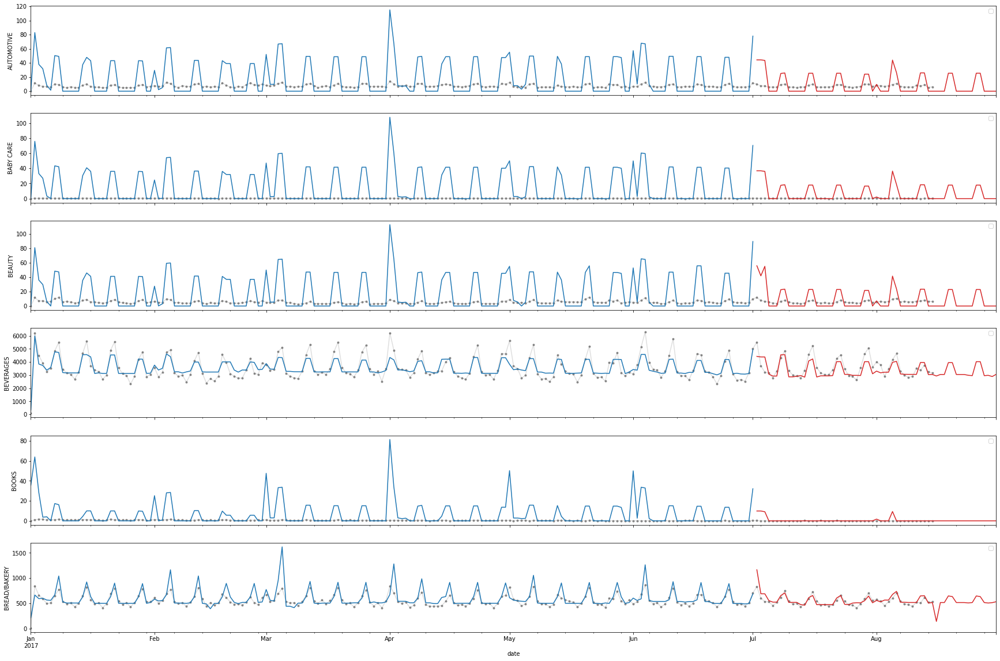

In [60]:
y_train, y_valid = y[:"2017-07-01"], y["2017-07-02":]
X1_train, X1_valid = X_1[:"2017-07-01"], X_1["2017-07-02":]
X2_train, X2_valid = X_2.loc[:"2017-07-01"], X_2.loc["2017-07-02":]
X2_train.fillna(0, inplace=True)

model.fit(X1_train, X2_train, y_train)
y_fit = model.predict(X1_train, X2_train).clip(0.0)
y_pred = model.predict(X1_valid, X2_valid).clip(0.0)

families = y.columns[0:6]
axs = y.loc(axis=1)[families].plot(subplots=True, 
                                   sharex=True, 
                                   figsize=(30, 20), 
                                   color="0.75",
                                   style=".-",
                                   markeredgecolor="0.25",
                                   markerfacecolor="0.25",
                                   alpha=0.5)
_ = y_fit.loc(axis=1)[families].plot(subplots=True, sharex=True, color='C0', ax=axs)
_ = y_pred.loc(axis=1)[families].plot(subplots=True, sharex=True, color='C3', ax=axs)
for ax, family in zip(axs, families):
    ax.legend([])
    ax.set_ylabel(family)

In [61]:
y_pred # tableau croisé dynamique, puis on retire les données d'aout et on voit à quel point les prédictions fittent bien par rapport au jdd train du dessus

family,AUTOMOTIVE,BABY CARE,BEAUTY,BEVERAGES,BOOKS,BREAD/BAKERY,CELEBRATION,CLEANING,DAIRY,DELI,...,MAGAZINES,MEATS,PERSONAL CARE,PET SUPPLIES,PLAYERS AND ELECTRONICS,POULTRY,PREPARED FOODS,PRODUCE,SCHOOL AND OFFICE SUPPLIES,SEAFOOD
date,,,,,,,,,,,,,,,,,,,,,
2017-07-02,44.290796,36.869666,55.861931,4425.529248,9.841580,1165.470380,23.914830,2633.004484,1381.943285,332.781551,...,30.396003,406.592666,475.860822,40.105229,42.297612,428.157621,124.028743,2615.992051,39.118192,52.985738
2017-07-03,44.292299,36.868476,41.874894,4383.667378,9.835535,690.864918,23.918432,2619.649005,1368.335044,346.824478,...,30.399172,406.671252,461.935849,40.113782,42.297650,428.133145,123.845085,2616.868556,39.140671,52.972697
2017-07-04,43.524955,36.098438,55.090642,4382.541715,9.060642,690.043621,23.153185,2591.302681,1367.599483,332.126958,...,29.633493,405.980985,460.883572,39.353483,41.528835,427.339818,122.892576,4232.727086,38.394301,52.190805
2017-07-05,0.000000,0.000000,0.000000,3073.973180,0.000000,555.509554,0.000000,863.662839,323.766876,339.406071,...,0.367988,373.110367,325.426802,7.903910,10.070748,387.334359,82.727935,2729.291229,1.465060,13.036596
2017-07-06,0.000000,0.000000,0.000000,2925.577681,0.000000,526.093371,0.000000,805.817125,498.227696,293.312301,...,0.000000,367.427093,252.212853,0.000000,0.000000,371.464285,66.698680,2123.956964,0.000000,0.142487
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-08-27,25.462560,17.890603,22.895340,4023.932193,0.000000,635.026943,5.204059,1323.470860,1050.083291,420.646838,...,11.661019,392.081014,405.187220,21.671736,23.387276,407.874555,94.831489,2470.312020,50.497371,33.342994
2017-08-28,0.000000,0.000000,0.000000,2956.501689,0.000000,516.967208,0.000000,887.369158,919.406519,289.993894,...,0.000000,361.925079,274.411572,0.000000,0.000000,366.903249,55.890454,2305.034404,0.000000,0.000000
2017-08-29,0.000000,0.000000,0.000000,2981.694630,0.000000,507.859644,0.000000,886.366767,878.412997,288.762603,...,0.000000,360.715247,272.839721,0.000000,0.000000,365.590356,54.418379,1983.306272,0.000000,0.000000


In [62]:
y_pred['date'] = y_pred.index

In [63]:
y_pred_tmp = y_pred.melt(id_vars=["date"], 
        var_name="Family", 
        value_name="Value")

In [64]:
y_pred = y_pred_tmp.loc[y_pred_tmp['date'] < '2017-08-16']

In [65]:
df_train_tmp = df_train.loc[(df_train['date'] < '2017-08-16') & (df_train['date'] >= '2017-07-02')]

In [66]:
df_train_tmp = df_train_tmp[['date', 'family', 'sales']]

In [67]:
df_train_tmp2 = df_train_tmp.groupby(by=['date', 'family'], as_index=False).sum()
df_train_tmp2 = df_train_tmp2.sort_values(by=['family', 'date'])

In [68]:
print('mean_squared_log_error is',np.sqrt(mean_squared_log_error(y_pred['Value'], df_train_tmp2['sales'])))

mean_squared_log_error is 4.668889831313944


The metric here is a bit higher than in the first model, which means our approach did not perform better. We can actually confirm this using the plots above: our model predicts seasonality for families where there is no seasonality at all, which causes the Mean Squared Log Error to rise a little.

## 3.3 Simple Moving Average

In [69]:
df_tmp = df.copy()
df_train_tmp3 = df_train.copy()

/usr/local/lib/python3.8/dist-packages/statsmodels/regression/linear_model.py:1434: RuntimeWarning:

invalid value encountered in sqrt

<ipython-input-70-75d22a046ead>:4: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

<ipython-input-70-75d22a046ead>:4: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

<ipython-input-70-75d22a046ead>:4: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this 

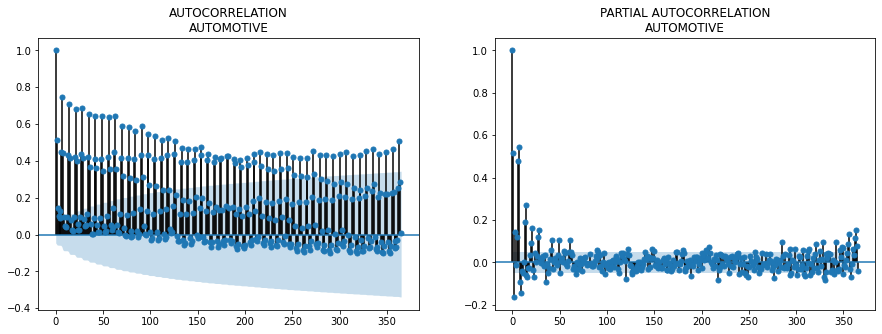

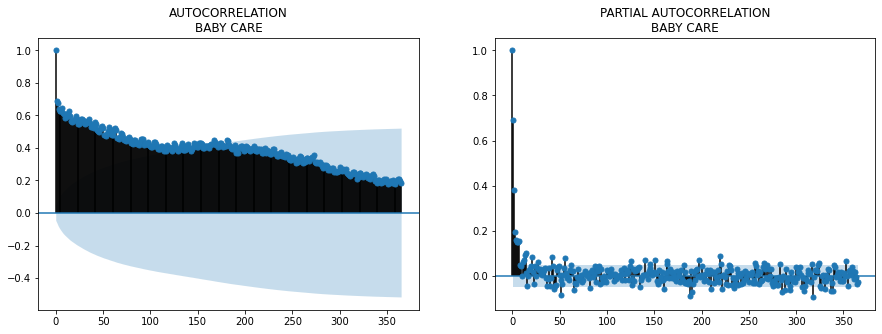

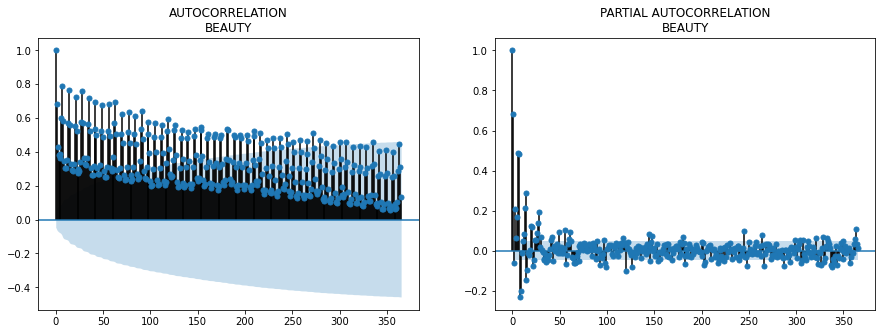

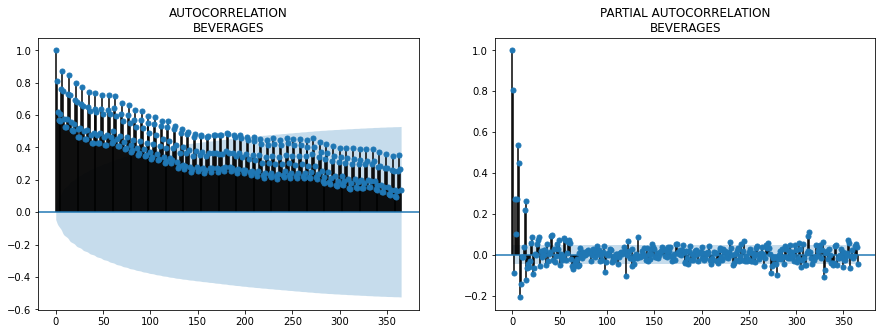

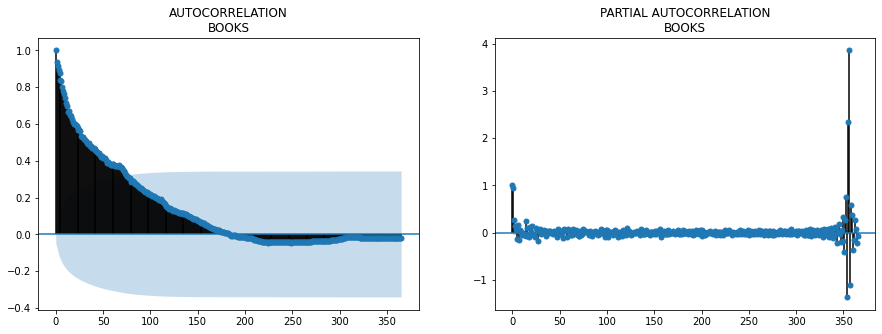

...

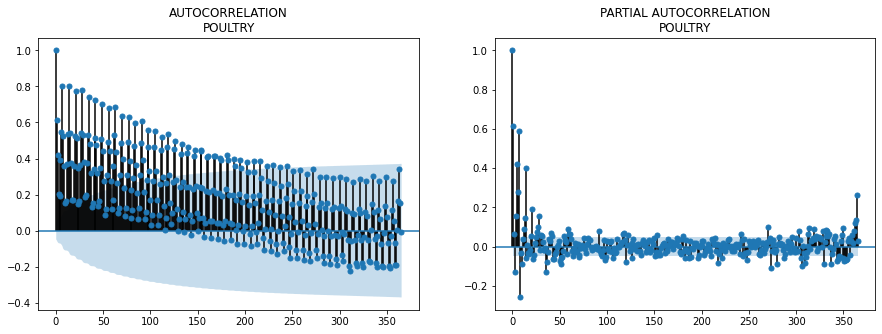

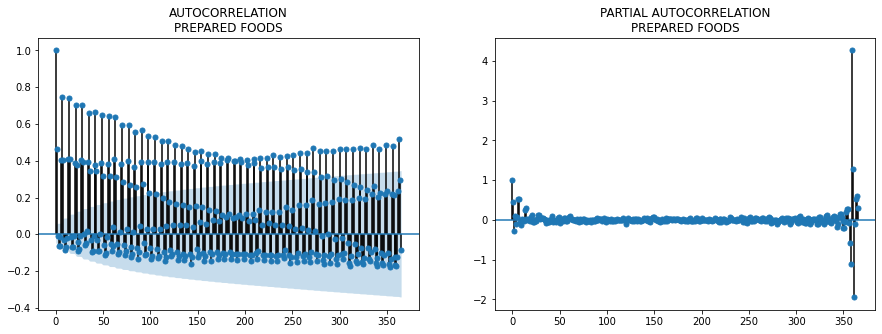

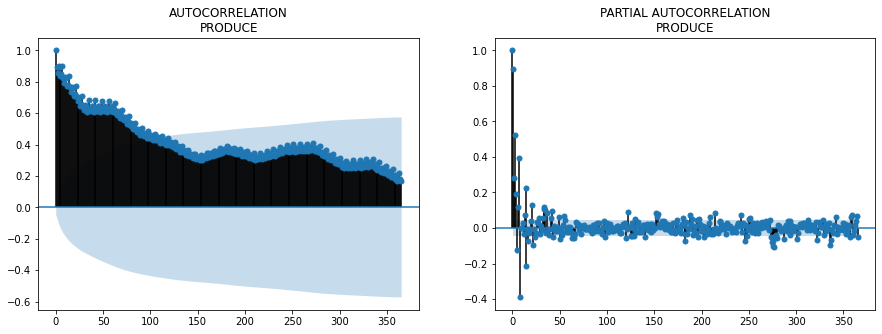

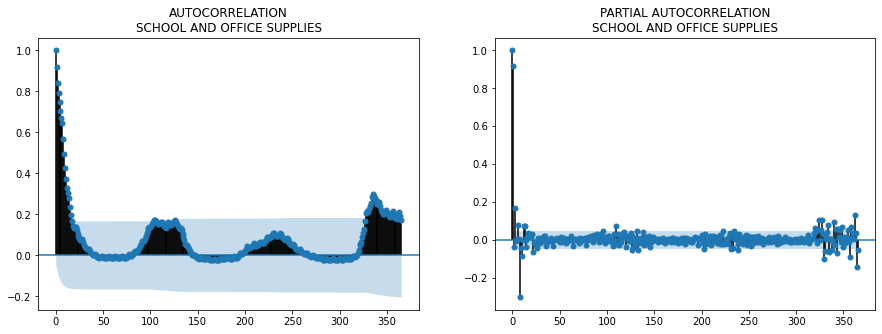

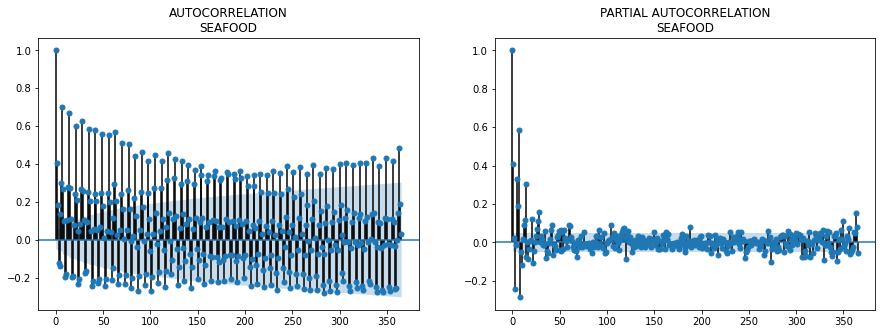

In [70]:
a = df_tmp[(df_tmp.sales.notnull())].groupby(["date", "family"]).sales.mean().reset_index().set_index("date")
for num, i in enumerate(a.family.unique()):
    try:
        fig, ax = plt.subplots(1,2,figsize=(15,5))
        temp = a[(a.family == i)]#& (a.sales.notnull())
        sm.graphics.tsa.plot_acf(temp.sales, lags=365, ax=ax[0], title = "AUTOCORRELATION\n" + i)
        sm.graphics.tsa.plot_pacf(temp.sales, lags=365, ax=ax[1], title = "PARTIAL AUTOCORRELATION\n" + i)
    except:
        pass

We will try with lags 16, 20, 30, 45, 365, 730 from PACF. 

In [71]:
a = df.sort_values(["store_nbr", "family", "date"])
for i in [20, 30, 45, 60, 90, 120, 365, 730]:
    a["SMA"+str(i)+"_sales_lag16"] = a.groupby(["store_nbr", "family"]).rolling(i).sales.mean().shift(16).values
    a["SMA"+str(i)+"_sales_lag30"] = a.groupby(["store_nbr", "family"]).rolling(i).sales.mean().shift(30).values
    a["SMA"+str(i)+"_sales_lag60"] = a.groupby(["store_nbr", "family"]).rolling(i).sales.mean().shift(60).values
print("Correlation")
a[["sales"]+a.columns[a.columns.str.startswith("SMA")].tolist()].corr()

Correlation


,sales,SMA20_sales_lag16,SMA20_sales_lag30,SMA20_sales_lag60,SMA30_sales_lag16,SMA30_sales_lag30,SMA30_sales_lag60,SMA45_sales_lag16,SMA45_sales_lag30,SMA45_sales_lag60,...,SMA90_sales_lag60,SMA120_sales_lag16,SMA120_sales_lag30,SMA120_sales_lag60,SMA365_sales_lag16,SMA365_sales_lag30,SMA365_sales_lag60,SMA730_sales_lag16,SMA730_sales_lag30,SMA730_sales_lag60
sales,1.000000,0.915878,0.900937,0.881120,0.915143,0.902502,0.878385,0.916428,0.904326,0.878210,...,0.874354,0.912324,0.898656,0.872643,0.910857,0.899953,0.875360,0.913464,0.898855,0.868593
SMA20_sales_lag16,0.915878,1.000000,0.985993,0.957782,0.997381,0.983344,0.960818,0.992844,0.981125,0.961741,...,0.957767,0.980745,0.973323,0.954856,0.969702,0.967173,0.957375,0.970431,0.969025,0.956697
SMA20_sales_lag30,0.900937,0.985993,1.000000,0.968676,0.994361,0.997381,0.969770,0.996124,0.992844,0.971758,...,0.968534,0.985168,0.980745,0.965674,0.971426,0.969702,0.965707,0.970726,0.970431,0.967253
SMA20_sales_lag60,0.881120,0.957782,0.968676,1.000000,0.967812,0.976342,0.997381,0.976635,0.988852,0.992844,...,0.985392,0.988314,0.987625,0.980745,0.973675,0.972722,0.969702,0.971662,0.971339,0.970431
SMA30_sales_lag16,0.915143,0.997381,0.994361,0.967812,1.000000,0.991923,0.970174,0.997391,0.988678,0.971707,...,0.968301,0.985610,0.979194,0.965493,0.973694,0.971314,0.967771,0.972807,0.971615,0.968241
SMA30_sales_lag30,0.902502,0.983344,0.997381,0.976342,0.991923,1.000000,0.976524,0.997683,0.997391,0.977263,...,0.974126,0.989303,0.985610,0.971037,0.975265,0.973694,0.969131,0.973258,0.972807,0.969659
SMA30_sales_lag60,0.878385,0.960818,0.969770,0.997381,0.970174,0.976524,1.000000,0.977757,0.987728,0.997391,...,0.989992,0.991617,0.991191,0.985610,0.977492,0.976509,0.973694,0.974118,0.973820,0.972807
SMA45_sales_lag16,0.916428,0.992844,0.996124,0.976635,0.997391,0.997683,0.977757,1.000000,0.995797,0.978315,...,0.974953,0.990782,0.985681,0.971944,0.978094,0.976032,0.971722,0.975269,0.974238,0.970716
SMA45_sales_lag30,0.904326,0.981125,0.992844,0.988852,0.988678,0.997391,0.987728,0.995797,1.000000,0.986514,...,0.981951,0.993588,0.990782,0.978348,0.979519,0.978094,0.973569,0.975773,0.975269,0.972369
SMA45_sales_lag60,0.878210,0.961741,0.971758,0.992844,0.971707,0.977263,0.997391,0.978315,0.986514,1.000000,...,0.994515,0.994822,0.994861,0.990782,0.981591,0.980765,0.978094,0.976413,0.976249,0.975269


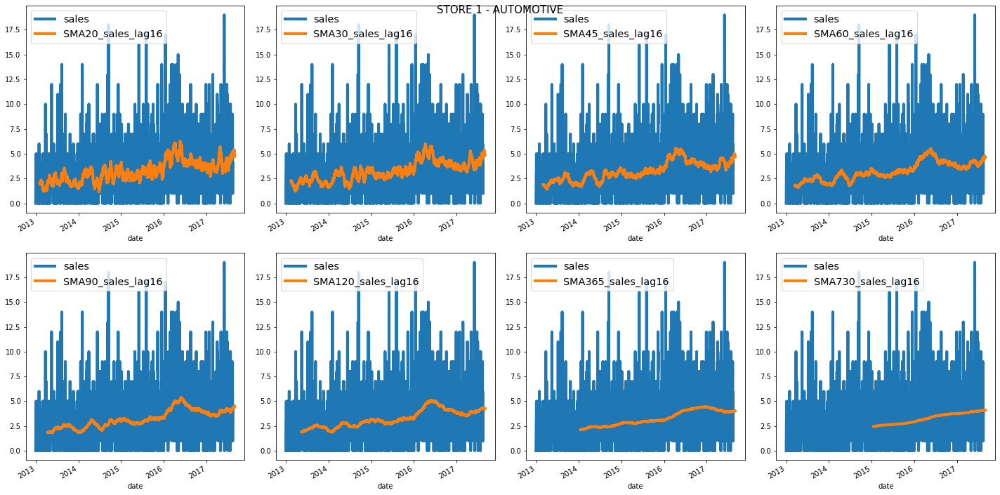

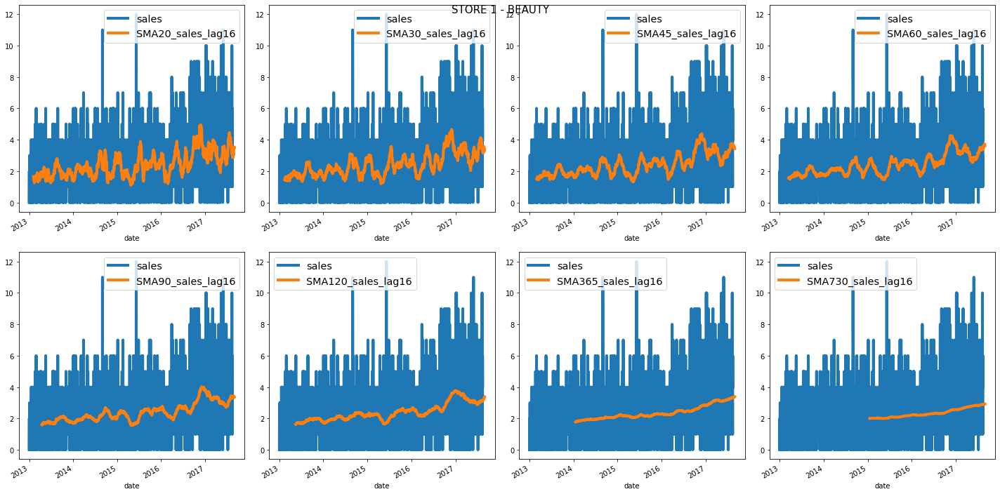

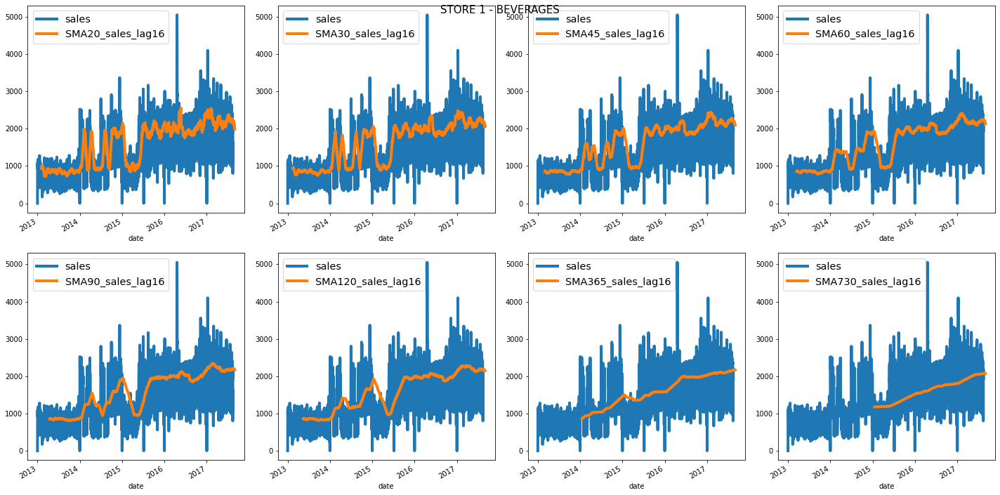

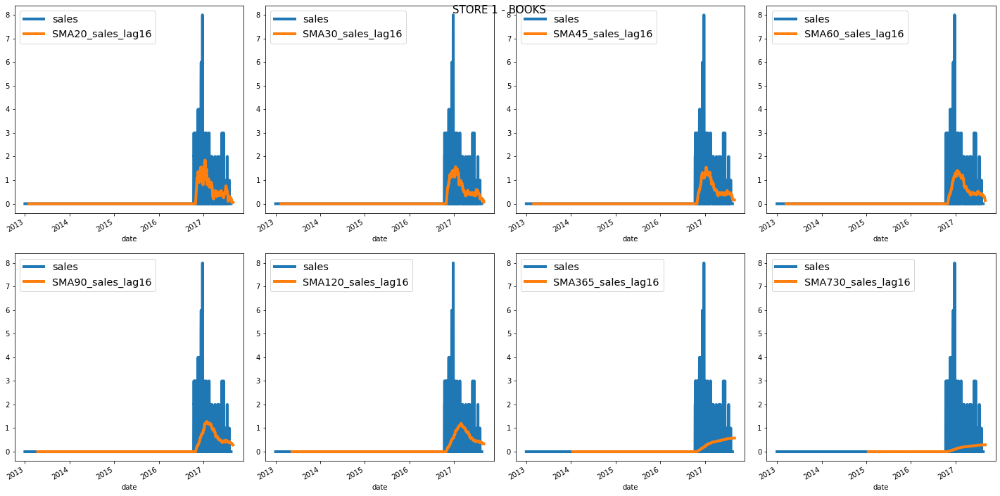

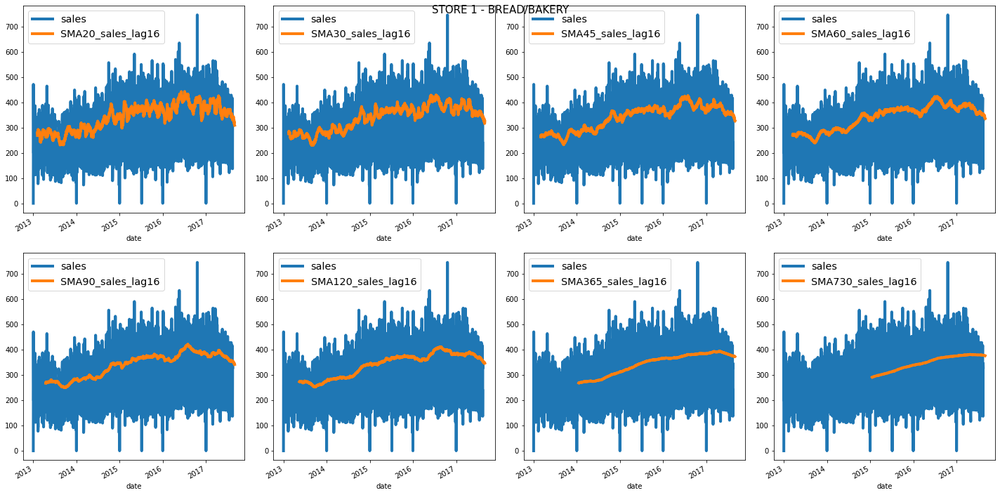

...

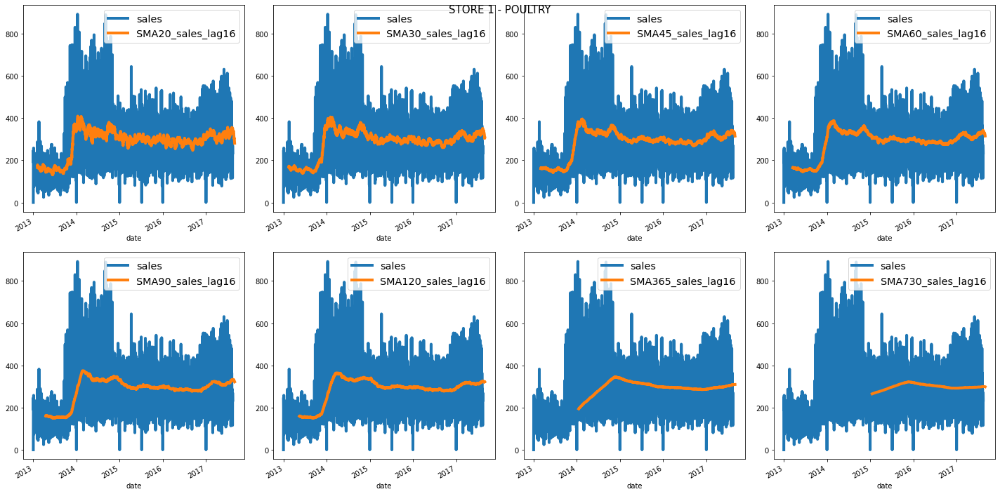

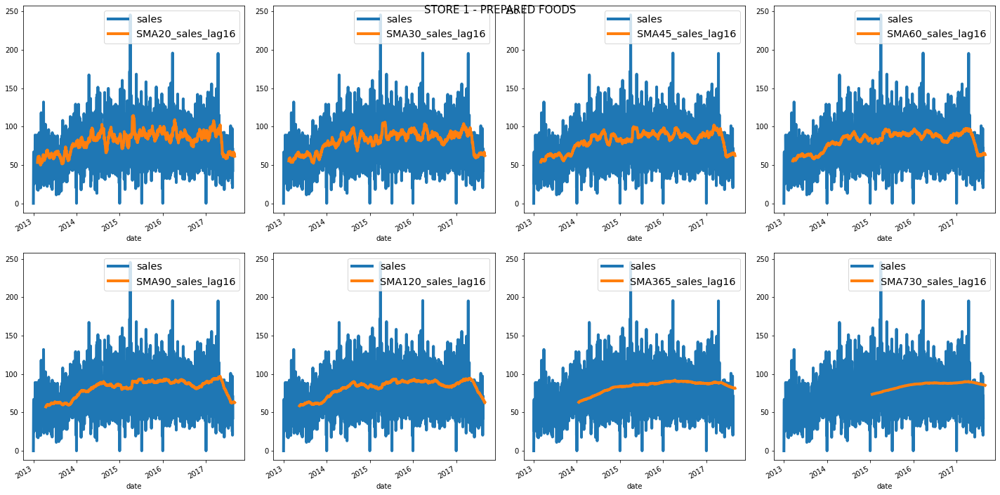

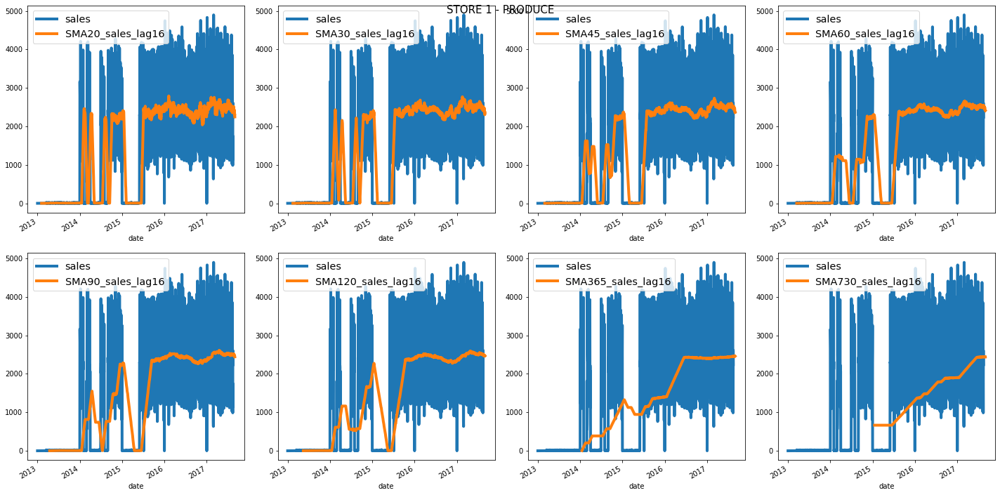

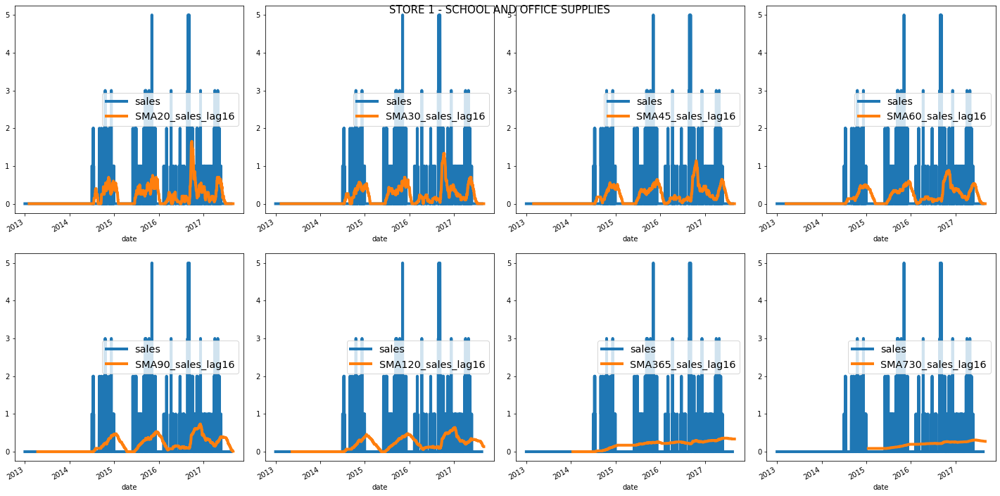

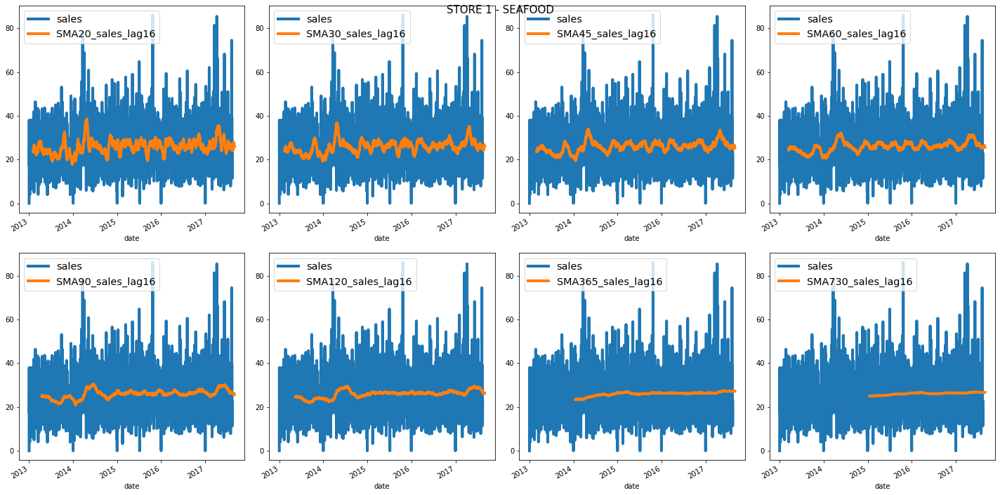

In [72]:
b = a[(a.store_nbr == 1)].set_index("date")
for i in b.family.unique():
    fig, ax = plt.subplots(2,4,figsize=(20,10))
    b[b.family == i][["sales", "SMA20_sales_lag16"]].plot(legend = True, ax = ax[0,0], linewidth = 4)
    b[b.family == i][["sales", "SMA30_sales_lag16"]].plot(legend = True, ax = ax[0,1], linewidth = 4)
    b[b.family == i][["sales", "SMA45_sales_lag16"]].plot(legend = True, ax = ax[0,2], linewidth = 4)
    b[b.family == i][["sales", "SMA60_sales_lag16"]].plot(legend = True, ax = ax[0,3], linewidth = 4)
    b[b.family == i][["sales", "SMA90_sales_lag16"]].plot(legend = True, ax = ax[1,0], linewidth = 4)
    b[b.family == i][["sales", "SMA120_sales_lag16"]].plot(legend = True, ax = ax[1,1], linewidth = 4)
    b[b.family == i][["sales", "SMA365_sales_lag16"]].plot(legend = True, ax = ax[1,2], linewidth = 4)
    b[b.family == i][["sales", "SMA730_sales_lag16"]].plot(legend = True, ax = ax[1,3], linewidth = 4)
    plt.suptitle("STORE 1 - "+i, fontsize = 15)
    plt.tight_layout(pad = 1.5)
    for j in range(0,4):
        ax[0,j].legend(fontsize="x-large")
        ax[1,j].legend(fontsize="x-large")
    plt.show()

In [73]:
b

,id,store_nbr,family,sales,onpromotion,transactions,city,state,type,cluster,...,SMA90_sales_lag60,SMA120_sales_lag16,SMA120_sales_lag30,SMA120_sales_lag60,SMA365_sales_lag16,SMA365_sales_lag30,SMA365_sales_lag60,SMA730_sales_lag16,SMA730_sales_lag30,SMA730_sales_lag60
date,,,,,,,,,,,,,,,,,,,,,
2013-01-01,0,1,AUTOMOTIVE,0.0,0,NaN,Quito,Pichincha,D,13,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-01-02,1782,1,AUTOMOTIVE,2.0,0,2111.0,Quito,Pichincha,D,13,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-01-03,3564,1,AUTOMOTIVE,3.0,0,1833.0,Quito,Pichincha,D,13,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-01-04,5346,1,AUTOMOTIVE,3.0,0,1863.0,Quito,Pichincha,D,13,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-01-05,7128,1,AUTOMOTIVE,5.0,0,1509.0,Quito,Pichincha,D,13,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-08-27,3020522,1,SEAFOOD,NaN,0,NaN,Quito,Pichincha,D,13,...,27.801778,26.358933,27.156617,29.134325,27.211808,27.229312,27.321455,26.753671,26.664404,26.728323
2017-08-28,3022304,1,SEAFOOD,NaN,1,NaN,Quito,Pichincha,D,13,...,27.353278,26.387492,26.926233,28.872150,27.214173,27.229937,27.279869,26.758075,26.658740,26.723364
2017-08-29,3024086,1,SEAFOOD,NaN,0,NaN,Quito,Pichincha,D,13,...,27.178311,26.305583,26.588758,28.906050,27.217244,27.128625,27.302142,26.736945,26.628190,26.728981


In [74]:
b.columns

Index(['id', 'store_nbr', 'family', 'sales', 'onpromotion', 'transactions',
       'city', 'state', 'type', 'cluster', 'description',
       'dcoilwtico_interpolated', 'SMA20_sales_lag16', 'SMA20_sales_lag30',
       'SMA20_sales_lag60', 'SMA30_sales_lag16', 'SMA30_sales_lag30',
       'SMA30_sales_lag60', 'SMA45_sales_lag16', 'SMA45_sales_lag30',
       'SMA45_sales_lag60', 'SMA60_sales_lag16', 'SMA60_sales_lag30',
       'SMA60_sales_lag60', 'SMA90_sales_lag16', 'SMA90_sales_lag30',
       'SMA90_sales_lag60', 'SMA120_sales_lag16', 'SMA120_sales_lag30',
       'SMA120_sales_lag60', 'SMA365_sales_lag16', 'SMA365_sales_lag30',
       'SMA365_sales_lag60', 'SMA730_sales_lag16', 'SMA730_sales_lag30',
       'SMA730_sales_lag60'],
      dtype='object')

In [75]:
df3 = b.copy()

In [76]:
df3['date2'] = df3.index
df3 = df3.loc[(df3['date2'] < '2016-08-07') & (df3['date2'] >= '2016-08-06')]
df_train_tmp = df_train.loc[(df_train['date'] < '2016-08-07') & (df_train['date'] >= '2016-08-06')]
df_train_tmp2 = df_train_tmp.groupby(by=['date', 'family'], as_index=False).sum()
df_train_tmp2 = df_train_tmp2.loc[df_train_tmp2['family'] != 'BABY CARE']
df_train_tmp2 = df_train_tmp2.sort_values(by=['family', 'date'])

In [77]:
df3 = df3.groupby(by=['date2', 'family'], as_index=False).sum()

In [78]:
df3.drop(columns=['id', 'store_nbr', 'family', 'sales', 'onpromotion', 'transactions',
       'cluster',
       'dcoilwtico_interpolated', 'date2'], axis=1, inplace=True)

In [79]:
for i in df3.columns:
  print(i, 'root_mean_squared_log_error is', np.sqrt(mean_squared_log_error(df_train_tmp2['sales'],df3[i])))

SMA20_sales_lag16 root_mean_squared_log_error is 4.251196716139051
SMA20_sales_lag30 root_mean_squared_log_error is 4.2358938750221595
SMA20_sales_lag60 root_mean_squared_log_error is 4.273190121342781
SMA30_sales_lag16 root_mean_squared_log_error is 4.227969752937832
SMA30_sales_lag30 root_mean_squared_log_error is 4.215039725300273
SMA30_sales_lag60 root_mean_squared_log_error is 4.236348435332294
SMA45_sales_lag16 root_mean_squared_log_error is 4.2236218863533
SMA45_sales_lag30 root_mean_squared_log_error is 4.2316182782346266
SMA45_sales_lag60 root_mean_squared_log_error is 4.2133049565203855
SMA60_sales_lag16 root_mean_squared_log_error is 4.236940272646862
SMA60_sales_lag30 root_mean_squared_log_error is 4.22354317401762
SMA60_sales_lag60 root_mean_squared_log_error is 4.177515514219784
SMA90_sales_lag16 root_mean_squared_log_error is 4.216123424105828
SMA90_sales_lag30 root_mean_squared_log_error is 4.188062557609716
SMA90_sales_lag60 root_mean_squared_log_error is 4.19374121916

The best value here came with SMA60_sales_lag60 which got a RMSLE of 4.17, which is better than 4.32 for the baseline regression and 4.66 for the ensemble learning. Which makes sense again, because we can on the plots that this method does great with seasonality.